In [13]:
from facenet_pytorch import MTCNN, InceptionResnetV1,models
import torch
import numpy as np
import mmcv, cv2
from PIL import Image, ImageDraw
   from IPython import display
from torch.utils.data import DataLoader
from torchvision import datasets
import numpy as np
import pandas as pd
import os

workers = 0 if os.name == 'nt' else 4

In [14]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print('Running on device: {}'.format(device))

Running on device: cpu


#### Define MTCNN module

Note that, since MTCNN is a collection of neural nets and other code, the device must be passed in the following way to enable copying of objects when needed internally.

See `help(MTCNN)` for more details.

In [3]:
mtcnn = MTCNN(keep_all=True, device=device)

In [22]:
mtcnn = MTCNN(
    image_size=160, margin=0, min_face_size=20,
    thresholds=[0.6, 0.7, 0.7], factor=0.709, post_process=True,
    device=device
)

#### Get a sample video

We begin by loading a video with some faces in it. The `mmcv` PyPI package by mmlabs is used to read the video frames (it can be installed with `pip install mmcv`). Frames are then converted to PIL images.

In [5]:
video = mmcv.VideoReader('video.mp4')
frames = [Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)) for frame in video]

display.Video('video.mp4', width=640)

#### Run video through MTCNN

We iterate through each frame, detect faces, and draw their bounding boxes on the video frames.

In [6]:
frames_tracked = []
for i, frame in enumerate(frames):
    print('\rTracking frame: {}'.format(i + 1), end='')
    
    # Detect faces
    boxes, _ = mtcnn.detect(frame)
    
    # Draw faces
    frame_draw = frame.copy()
    draw = ImageDraw.Draw(frame_draw)
    for box in boxes:
        draw.rectangle(box.tolist(), outline=(255, 0, 0), width=6)
    
    # Add to frame list
    frames_tracked.append(frame_draw.resize((640, 360), Image.Resampling.BILINEAR))
print('\nDone')

Tracking frame: 1

C:\Users\amrit\AppData\Local\Temp\ipykernel_11276\1931854803.py:15: DeprecationWarning: BILINEAR is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.BILINEAR instead.
  frames_tracked.append(frame_draw.resize((640, 360), Image.BILINEAR))


Tracking frame: 105
Done


#### Display detections

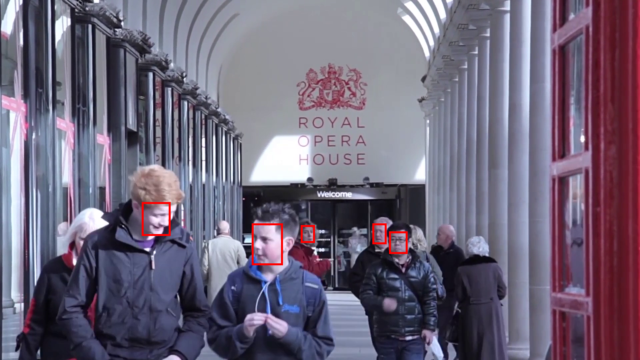

In [7]:
d = display.display(frames_tracked[0], display_id=True)
i = 1
try:
    while True:
        d.update(frames_tracked[i % len(frames_tracked)])
        i += 1
except KeyboardInterrupt:
    pass

#### Save tracked video

In [6]:
dim = frames_tracked[0].size
fourcc = cv2.VideoWriter_fourcc(*'FMP4')    
video_tracked = cv2.VideoWriter('video_tracked.mp4', fourcc, 25.0, dim)
for frame in frames_tracked:
    video_tracked.write(cv2.cvtColor(np.array(frame), cv2.COLOR_RGB2BGR))
video_tracked.release()

NameError: name 'frames_tracked' is not defined

# detect face from pic


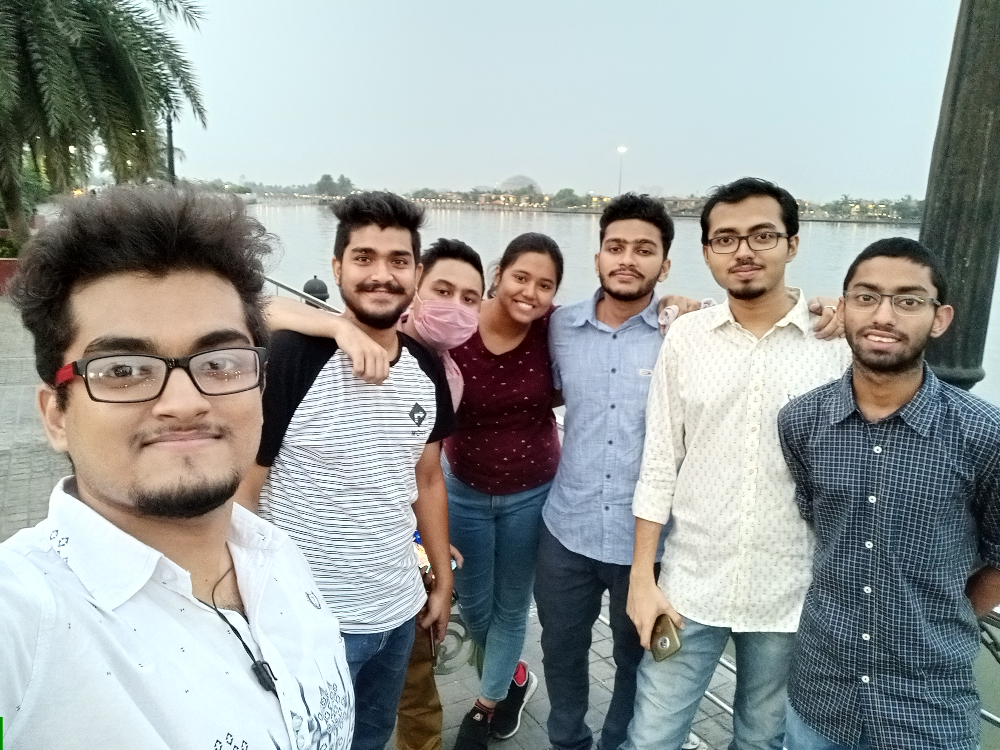

In [16]:
image = Image.open("IMG_20210404_175511_656.jpg").convert('RGB')
display.display(image)

In [17]:
boxes, u = mtcnn.detect(image)

cropped_image = []
for box in boxes:
   cropped_image.append(image.crop((box.tolist())))




   



# test mtcnn and resnet

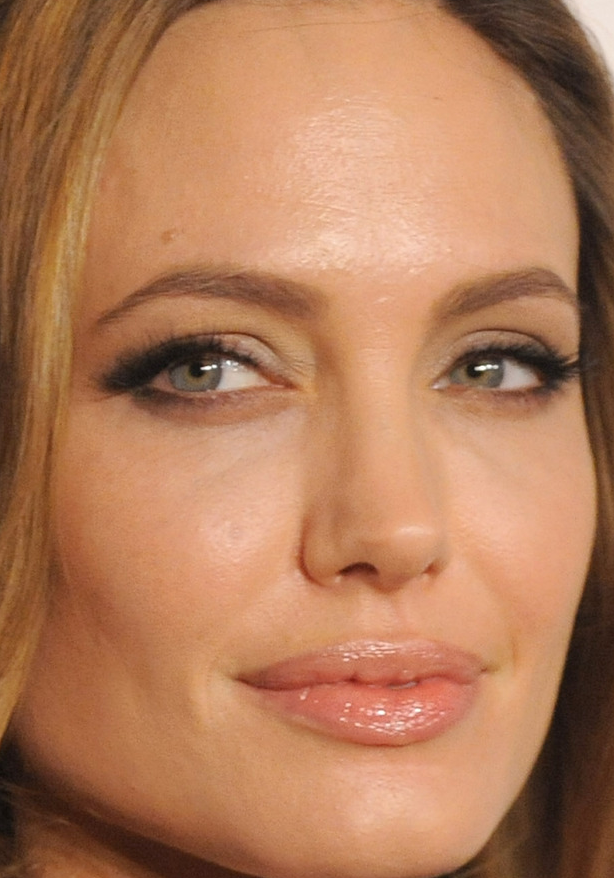

In [47]:
image = Image.open("facenet_pytorch/data/test_images/angelina_jolie/1.jpg").convert('RGB')
boxes, _ = mtcnn.detect(image)


cropped_image = image.crop((boxes[0].tolist()))
   
display.display(cropped_image)

In [65]:

aligned1, prob = mtcnn(cropped_image, return_prob=True)
print('Face detected with probability: {:8f}'.format(prob))
resnet = InceptionResnetV1(pretrained='vggface2').eval().to(device)


Face detected with probability: 0.999974


In [74]:
_aligned1 = torch.stack([aligned1]).to(device)
embeddings1 = resnet(_aligned1).detach().cpu()

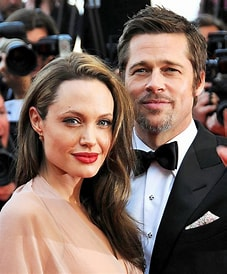

In [75]:
image = Image.open("Image_to_be_tested/a/th.jpeg").convert('RGB')
display.display(image)

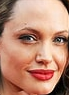

In [77]:
boxes, _ = mtcnn.detect(image)

cropped_image = []
for box in boxes:
   cropped_image.append(image.crop((box.tolist())))

cropped_image[0]

In [82]:
aligned2, prob = mtcnn(cropped_image[0], return_prob=True)
print('Face detected with probability: {:8f}'.format(prob))
resnet = InceptionResnetV1(pretrained='vggface2').eval().to(device)

Face detected with probability: 0.999995


In [84]:
_aligned2 = torch.stack([aligned2]).to(device)
embeddings2 = resnet(_aligned2).detach().cpu()

In [91]:
(embeddings1-embeddings2).norm()

tensor(0.6703)

# with resnet create own directories and train

In [92]:
import os
import numpy as np
import torch
import torchvision.transforms as transforms
from PIL import Image
from facenet_pytorch import MTCNN, InceptionResnetV1

# Define the function to preprocess the image
def preprocess_image(image):
    image = Image.open(image).convert('RGB')
    image_tensor = transforms.ToTensor()(image).unsqueeze(0).to(device)
    return image_tensor

# Initialize the MTCNN and ResNet models
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
mtcnn = MTCNN(device=device)
resnet = InceptionResnetV1(pretrained='vggface2').eval().to(device)

# Path to the directory containing the images of known individuals
root_directory = "facenet_pytorch/data/test_images"

# Initialize empty lists for face embeddings and names
known_embeddings = []
known_names = []

# Iterate over the subdirectories (person's names) in the root directory
for name in os.listdir(root_directory):
    person_directory = os.path.join(root_directory, name)
    if not os.path.isdir(person_directory):
        continue
    
    # Initialize empty lists for face embeddings and names of the current person
    embeddings = []
    person_names = []
    
    # Iterate over the images in the person's directory
    for filename in os.listdir(person_directory):
        image_path = os.path.join(person_directory, filename)
        image_tensor = preprocess_image(image_path)
        
        with torch.no_grad():
            faces = mtcnn(image_tensor)
            embedding = resnet(faces).detach().cpu().numpy()
            embeddings.append(embedding)
        
        person_names.append(name)
    
    # Append the embeddings and names of the current person to the known embeddings and names
    known_embeddings.extend(embeddings)
    known_names.extend(person_names)

# Convert the lists to NumPy arrays
known_embeddings = np.concatenate(known_embeddings)
known_names = np.array(known_names)

# Save the known embeddings and names to files
np.save('path/to/known_embeddings.npy', known_embeddings)
np.save('path/to/known_names.npy', known_names)


RuntimeError: torch.cat(): expected a non-empty list of Tensors